# Full Slice Registration — CONSTRAINED-SEARCH + PEAK-DOMINANCE GATE
### Monje Lab — full z-slice mosaic, Hann-window rows + windowed peak search + peak-dominance signal gate

> **This is the constrained-search notebook with a NEW signal gate.** It is identical to
> `full_slice_registration_constrained.ipynb` (windowed peak search: a horizontal pair barely
> moves vertically, `|dy| ≤ MAX_CROSS_PX`; a vertical pair barely horizontally; the join-axis
> shift stays in a band around the assumed overlap) — **except for how a seam is decided
> trustworthy.**
>
> The old gate (`enough_signal`) trusted a seam when enough of its overlap was *bright*
> (`fraction > tissue threshold`). That fails on a **bright-but-textureless** box — a smooth
> illumination glow or pure noise — which passes the brightness test yet carries no registrable
> structure, so its phase-correlation surface is flat and the "shift" is meaningless.
>
> This notebook gates instead on **peak dominance**: trust the shift only when the constrained
> correlation peak is *unique and sharp* — it clearly beats the next-best peak
> (`peak_ratio ≥ MIN_PEAK_RATIO`) and stands out of the surrounding surface
> (`peak_z ≥ MIN_PEAK_Z`). A smooth/noise box gives `peak_ratio ≈ 1` (no dominant peak) and is
> sent to the nominal overlap; real texture gives a dominant peak and keeps its measured shift.
> This directly measures *"does this seam have a unique registration solution"* rather than a
> brightness proxy for it.
>
> **Scope: the peak-dominance gate applies to the HORIZONTAL stage only** (adjacent tiles within
> a row). The **vertical** stage (stacking the row images) is left exactly as in
> `full_slice_registration_constrained.ipynb` — it keeps the original brightness-fraction gate
> (`enough_signal`).


Give a **grid of tile paths** for one z-slice: a list of rows, each row a list of tile
paths **left → right**; rows listed **top → bottom**. The slice is stitched in two stages:

| Stage | Method |
|-------|--------|
| **1 — Horizontal (build rows)** | Every adjacent pair in a row is registered left→right with the **`basic_horizontal` engine**: cut the overlap strips, crop their **rows** to the **tissue edge** (edge-focus box), then run phase cross-correlation after a **high-pass prefilter and a Hann window**. Each row is composited into one big row image. |
| **2 — Vertical (stack rows)** | The row images are registered top→bottom with the **same engine**, just rotated: crop the overlap strips to the tissue **columns** (the vertical seam runs left↔right), then the same **high-pass + Hann-window** PCC. Composited into the full mosaic. |

Both stages use the **same edge-focus + Hann-window PCC**; the only difference is the axis —
horizontal crops the box to the tissue *rows*, vertical crops it to the tissue *columns*.

At **every step** the placement is shown two ways so the improvement is visible:
- **Naive** — assumed overlap, no shift (`dy=dx=0`).
- **Registered** — the measured `(dy, dx)`.

Overlays are red/green/yellow (A = red, B = green, overlap = yellow). Blending is a
**sinusoidal (raised-cosine) cross-fade** over each overlap. The notebook shows the raw
input tiles, the edge-focus box + Hann window at each horizontal pair, the naive-vs-registered
overlay at every step, and the final naive-vs-registered mosaic.

**Shift convention:**
- Horizontal: right tile's left edge at `x = w_left − overlap + dx`, `y = dy`.
- Vertical:   bottom row's top edge at `y = h_top − overlap + dy`, `x = dx`.


In [222]:
# -- Imports -------------------------------------------------------
import warnings
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import tifffile
from pathlib import Path
from skimage.registration import phase_cross_correlation
from skimage.filters import threshold_otsu
from scipy.ndimage import gaussian_filter

matplotlib.rcParams['figure.dpi'] = 120

In [223]:
# -- Core helpers (from basic_horizontal) --------------------------

def load_tile(path):
    img = tifffile.imread(str(path)).astype('float32')
    while img.ndim > 2:
        img = img[0]
    return img


def norm_disp(img, lo_pct=0.5, hi_pct=99.5):
    """Scale to [0,1] for display with robust percentile limits, so a single
    bright speck can't squash the rest of an image to near-black."""
    lo, hi = np.percentile(img, [lo_pct, hi_pct])
    return np.clip((img - lo) / (hi - lo + 1e-9), 0.0, 1.0)


def highpass(img, sigma=12.0):
    """Subtract a large-sigma Gaussian to strip the smooth brightness envelope
    (residual vignette + tissue low-frequency gradient) so the true-texture
    correlation peak dominates. High-pass, NOT band-pass."""
    img = img.astype('float32')
    return img - gaussian_filter(img, sigma)


def hann2d(shape):
    """Separable 2D Hann window for a strip of the given shape."""
    return (np.hanning(shape[0])[:, None] * np.hanning(shape[1])[None, :]).astype('float32')


def register_pcc(strip_a, strip_b, upsample=20, highpass_sigma=12.0, window=True):
    """Phase cross-correlation of two overlap strips (high-passed). Returns
    (dy, dx): strip_b aligns to strip_a when shifted by (dy, dx).

    window=True applies a separable Hann window before the FFT (the twist that
    makes registration robust): tapering the strip to zero at its borders keeps
    hard edges / bright streaks from leaking a cross of energy through the FFT and
    stealing the peak on a spurious cross-axis shift. Both the horizontal and the
    vertical stages use window=True; window=False is kept for plain PCC if needed."""
    a, b = strip_a, strip_b
    if a.shape != b.shape:
        r = min(a.shape[0], b.shape[0]); c = min(a.shape[1], b.shape[1])
        a, b = a[:r, :c], b[:r, :c]
    if highpass_sigma:
        a, b = highpass(a, highpass_sigma), highpass(b, highpass_sigma)
    if window:
        win = hann2d(a.shape)
        a, b = a * win, b * win
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        shift, _, _ = phase_cross_correlation(a, b, upsample_factor=upsample)
    return float(shift[0]), float(shift[1])


def _pcc_prep(a, b, highpass_sigma, window):
    """Match shapes, high-pass, and Hann-window a pair of strips (shared by the
    plain and constrained PCC so both see identical input)."""
    if a.shape != b.shape:
        r = min(a.shape[0], b.shape[0]); c = min(a.shape[1], b.shape[1])
        a, b = a[:r, :c], b[:r, :c]
    if highpass_sigma:
        a, b = highpass(a, highpass_sigma), highpass(b, highpass_sigma)
    if window:
        win = hann2d(a.shape)
        a, b = a * win, b * win
    return a, b


def _parabolic_subpx(corr, py, px):
    """Sub-pixel offset of a correlation peak by a parabolic fit along each axis
    (replaces skimage's upsampled-DFT refinement for the constrained search)."""
    h, w = corr.shape
    def off(i, n, val):
        m1, p1, z = val((i - 1) % n), val((i + 1) % n), val(i)
        den = m1 - 2 * z + p1
        return 0.5 * (m1 - p1) / den if abs(den) > 1e-9 else 0.0
    dy = off(py, h, lambda k: corr[k, px])
    dx = off(px, w, lambda k: corr[py, k])
    return dy, dx


def register_pcc_constrained(strip_a, strip_b, highpass_sigma, window,
                             max_cross, join_center, join_half, axis, excl_px=5):
    """Phase correlation that takes the best peak WITHIN A PLAUSIBLE WINDOW instead
    of the global peak. Same normalized cross-power spectrum as `register_pcc`
    (verified to reproduce skimage's shift on well-conditioned pairs), but the
    peak search is masked to physically sensible shifts:

      * axis='h': |dy| <= max_cross (a horizontal pair barely moves vertically) and
        dx in [join_center +- join_half] (near the assumed overlap).
      * axis='v': |dx| <= max_cross and dy in the join window.

    A spurious global peak (e.g. PCC sliding along a diagonal edge to dy=+65) falls
    OUTSIDE the window, so the true peak inside it wins instead. Sub-pixel via a
    parabolic fit.

    Returns (dy, dx, peak_ratio, peak_z) -- the shift PLUS two PEAK-DOMINANCE scores
    measured on the constrained correlation surface, so the caller can separate a
    unique, sharp registration from an ambiguous one. A bright-but-textureless box
    (smooth glow / pure noise) yields a flat surface with no dominant peak:
      * peak_ratio = winning peak / next-highest peak OUTSIDE a +-excl_px neighbourhood
        (both taken inside the plausible window). ~1 => ambiguous, >1 => dominant.
      * peak_z     = (peak - mean) / std over the windowed surface (peak-to-sidelobe)."""
    a, b = _pcc_prep(strip_a, strip_b, highpass_sigma, window)
    A = np.fft.fft2(a); B = np.fft.fft2(b)
    R = A * np.conj(B); R /= np.abs(R) + 1e-12
    corr = np.fft.ifft2(R).real
    h, w = corr.shape
    dY = np.where(np.arange(h) > h // 2, np.arange(h) - h, np.arange(h))
    dX = np.where(np.arange(w) > w // 2, np.arange(w) - w, np.arange(w))
    if axis == 'h':
        oky = np.abs(dY) <= max_cross
        okx = (dX >= join_center - join_half) & (dX <= join_center + join_half)
    else:
        oky = (dY >= join_center - join_half) & (dY <= join_center + join_half)
        okx = np.abs(dX) <= max_cross
    ok = np.outer(oky, okx)
    masked = np.where(ok, corr, -np.inf)
    py, px = np.unravel_index(np.argmax(masked), masked.shape)
    dyf, dxf = _parabolic_subpx(corr, py, px)
    dy = (py - h if py > h // 2 else py) + dyf
    dx = (px - w if px > w // 2 else px) + dxf
    # -- peak dominance: is the winning peak unique and sharp? ----------
    pk = corr[py, px]
    vals = corr[ok]
    peak_z = float((pk - vals.mean()) / (vals.std() + 1e-12))
    yy = (np.arange(h) - py + h // 2) % h - h // 2   # circular distance to the peak
    xx = (np.arange(w) - px + w // 2) % w - w // 2
    excl = (np.abs(yy)[:, None] <= excl_px) & (np.abs(xx)[None, :] <= excl_px)
    second = np.where(ok & ~excl, corr, -np.inf).max()
    peak_ratio = float(pk / second) if second > 1e-9 else float('inf')
    return float(dy), float(dx), peak_ratio, peak_z


def edge_focus_box(strip_a, strip_b, thresh, pad_px, axis=0, min_frac=0.02, min_lines=32):
    """Indices (lo, hi) ALONG `axis` cropped to the tissue extent; the other
    dimension is left untouched. This is the "focus thin" box, generalised so the
    horizontal and vertical stages are analogous:

      * axis=0 crops ROWS  -> horizontal-seam strips (H x overlap): box hugs the
        tissue's vertical extent, full overlap width kept.
      * axis=1 crops COLS  -> vertical-seam strips (overlap x W): box hugs the
        tissue's horizontal extent, full overlap height kept.

    A line along `axis` counts as tissue when > min_frac of it is foreground
    (> thresh) in EITHER strip; keep [first..last] tissue lines padded by pad_px,
    clamped to the extent. Falls back to the full extent when there is too little
    tissue to trust (< min_lines lines)."""
    n = min(strip_a.shape[axis], strip_b.shape[axis])
    if axis == 0:
        a, b = strip_a[:n], strip_b[:n]
    else:
        a, b = strip_a[:, :n], strip_b[:, :n]
    mask = (a > thresh) | (b > thresh)
    cover = mask.mean(axis=1 - axis)            # foreground fraction per line along axis
    lines = np.where(cover > min_frac)[0]
    if lines.size == 0:
        return 0, n
    lo = max(0, int(lines[0]) - pad_px)
    hi = min(n, int(lines[-1]) + 1 + pad_px)
    if hi - lo < min_lines:
        return 0, n
    return lo, hi


def enough_signal(strip_a, strip_b, thresh, min_signal_frac):
    """Whether the two overlap strips carry enough tissue to trust PCC.

    Builds the same foreground mask edge_focus_box uses (pixels > thresh) and
    measures the fraction of EACH strip that is signal. Returns
    (ok, frac_a, frac_b): ok is False when EITHER strip has less than
    min_signal_frac of its pixels above threshold -- too little actual signal in
    the overlap to register reliably, so the caller skips PCC and falls back to
    the nominal assumed overlap (dy=dx=0)."""
    frac_a = float((strip_a > thresh).mean())
    frac_b = float((strip_b > thresh).mean())
    return (frac_a >= min_signal_frac and frac_b >= min_signal_frac), frac_a, frac_b


def peak_is_dominant(peak_ratio, peak_z, min_peak_ratio, min_peak_z):
    """The NEW signal gate. Trust a seam's PCC shift only when its correlation peak is
    DOMINANT: it clearly beats the next-best peak (peak_ratio) AND stands out of the
    surrounding surface (peak_z). Replaces the old brightness-fraction gate
    (`enough_signal`), which a bright-but-textureless box (smooth glow / noise) passes
    even though it carries no registrable structure and gives a flat, ambiguous peak."""
    return (peak_ratio >= min_peak_ratio) and (peak_z >= min_peak_z)


def sinusoid_ramp(n, feather):
    """Length-n weight: 1 in the interior, a raised-cosine ease from ~0 to 1 over
    `feather` px at each end -> a smooth sinusoidal cross-fade across overlaps."""
    w = np.ones(n, dtype='float32')
    f = int(min(feather, n // 2))
    if f > 0:
        t = (np.arange(f) + 1) / (f + 1)
        edge = (0.5 * (1 - np.cos(np.pi * t))).astype('float32')
        w[:f] = edge
        w[-f:] = edge[::-1]
    return w


def feather_weight(shape, axis, feather):
    """Sinusoidal cross-fade weight map ramping along `axis` (1 = left/right for a
    horizontal join, 0 = top/bottom for a vertical stack)."""
    ramp = sinusoid_ramp(shape[axis], feather)
    if axis == 1:
        return np.broadcast_to(ramp[None, :], shape).copy()
    return np.broadcast_to(ramp[:, None], shape).copy()


def composite(placements, feather_axis, feather_px):
    """Blend placed images onto one canvas with sinusoidal feathered weights so
    overlaps cross-fade. placements: list of (img, y0, x0) in a shared frame
    (offsets may be negative). Background pixels (value == 0) carry zero weight so
    they never bleed into a seam. Returns the canvas."""
    y_min = min(y0 for _, y0, _ in placements)
    x_min = min(x0 for _, _, x0 in placements)
    H = max(y0 - y_min + img.shape[0] for img, y0, _ in placements)
    W = max(x0 - x_min + img.shape[1] for img, _, x0 in placements)
    acc = np.zeros((H, W), 'float32'); wsum = np.zeros((H, W), 'float32')
    for img, y0, x0 in placements:
        yy, xx = y0 - y_min, x0 - x_min
        w = feather_weight(img.shape, feather_axis, feather_px)
        w[img == 0] = 0.0
        acc[yy:yy+img.shape[0], xx:xx+img.shape[1]] += w * img
        wsum[yy:yy+img.shape[0], xx:xx+img.shape[1]] += w
    return acc / np.maximum(wsum, 1e-6)

In [224]:
# -- Red/Green/Yellow overlay helpers ------------------------------
# A -> red channel, B -> green channel, so their overlap reads yellow.

def _overlay_canvas(img_a, img_b, b_y0, b_x0):
    h_a, w_a = img_a.shape; h_b, w_b = img_b.shape
    oy, ox = max(0, -b_y0), max(0, -b_x0)           # shift so nothing is clipped
    H = max(h_a, b_y0 + h_b) + oy
    W = max(w_a, b_x0 + w_b) + ox
    ch_a = np.zeros((H, W), 'float32'); ch_b = np.zeros((H, W), 'float32')
    ch_a[oy:oy+h_a, ox:ox+w_a] = norm_disp(img_a)
    ch_b[b_y0+oy:b_y0+oy+h_b, b_x0+ox:b_x0+ox+w_b] = norm_disp(img_b)
    return np.stack([ch_a, ch_b, np.zeros_like(ch_a)], -1)


def _legend(fig):
    fig.legend(handles=[mpatches.Patch(color=(1, 0, 0), label='A only'),
                        mpatches.Patch(color=(0, 1, 0), label='B only'),
                        mpatches.Patch(color=(1, 1, 0), label='Overlap (both)')],
               loc='upper right', fontsize=8, framealpha=0.6)


def compare_overlay_h(img_a, img_b, overlap, dy, dx, suptitle=''):
    """Horizontal pair (A=left, B=right): B left edge at x = w_a - overlap + dx."""
    w_a = img_a.shape[1]
    naive = _overlay_canvas(img_a, img_b, 0, w_a - overlap)
    reg   = _overlay_canvas(img_a, img_b, int(round(dy)), w_a - overlap + int(round(dx)))
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    axes[0].imshow(naive, aspect='auto'); axes[0].set_title('NAIVE  (dy=0, dx=0)', fontsize=9); axes[0].axis('off')
    axes[1].imshow(reg,   aspect='auto'); axes[1].set_title(f'REGISTERED  (dy={dy:+.1f}, dx={dx:+.1f})', fontsize=9); axes[1].axis('off')
    _legend(fig); fig.suptitle(suptitle, fontsize=10); plt.tight_layout(); plt.show()


def compare_overlay_v(img_a, img_b, overlap, dy, dx, suptitle=''):
    """Vertical pair (A=top, B=bottom): B top edge at y = h_a - overlap + dy."""
    h_a = img_a.shape[0]
    naive = _overlay_canvas(img_a, img_b, h_a - overlap, 0)
    reg   = _overlay_canvas(img_a, img_b, h_a - overlap + int(round(dy)), int(round(dx)))
    fig, axes = plt.subplots(1, 2, figsize=(12, 8))
    axes[0].imshow(naive, aspect='auto'); axes[0].set_title('NAIVE  (dy=0, dx=0)', fontsize=9); axes[0].axis('off')
    axes[1].imshow(reg,   aspect='auto'); axes[1].set_title(f'REGISTERED  (dy={dy:+.1f}, dx={dx:+.1f})', fontsize=9); axes[1].axis('off')
    _legend(fig); fig.suptitle(suptitle, fontsize=10); plt.tight_layout(); plt.show()

In [225]:
# -- Registration + line compositing -------------------------------

def register_row(tiles, overlap_frac, thresh, pad_px, upsample, highpass_sigma,
                 max_cross, join_band_frac, min_signal_frac,
                 min_peak_ratio, min_peak_z, label='', show=True):
    """Register a row of tiles left->right with the basic_horizontal engine, but
    with CONSTRAINED-SEARCH PCC: the peak is taken within |dy| <= max_cross and dx
    within +-join_band_frac x overlap, so a spurious diagonal-slide peak can't win.
    (`upsample` is unused here; the constrained search uses a parabolic sub-pixel
    fit.) Shows the box, the Hann window, and the overlay. Returns
    [(dy, dx, overlap), ...]."""
    shifts = []
    for i in range(1, len(tiles)):
        a, b = tiles[i-1], tiles[i]
        overlap = max(1, min(int(round(overlap_frac * a.shape[1])), a.shape[1], b.shape[1]))
        sa, sb = a[:, -overlap:], b[:, :overlap]          # A right edge, B left edge
        ok, fa, fb = enough_signal(sa, sb, thresh, min_signal_frac)
        if not ok:
            shifts.append((0.0, 0.0, overlap))
            print(f'  {label}: pair {i-1}-{i}  overlap={overlap}px  signal a={fa:.1%} '
                  f'b={fb:.1%} < {min_signal_frac:.1%}  -> too little signal, skipping '
                  f'PCC, using nominal overlap (dy=dx=0)')
            continue
        r0, r1 = edge_focus_box(sa, sb, thresh, pad_px, axis=0)
        dy, dx, pr, pz = register_pcc_constrained(sa[r0:r1], sb[r0:r1], highpass_sigma, True,
                                          max_cross, 0, int(round(join_band_frac * overlap)), 'h')
        if not peak_is_dominant(pr, pz, min_peak_ratio, min_peak_z):
            shifts.append((0.0, 0.0, overlap))
            print(f'  {label}: pair {i-1}-{i}  overlap={overlap}px  box rows {r0}-{r1}  '
                  f'peak_ratio={pr:.3f} < {min_peak_ratio} (peak_z={pz:.1f})  -> peak NOT '
                  f'dominant (smooth/noise, no registrable texture), using nominal overlap (dy=dx=0)')
            continue
        shifts.append((dy, dx, overlap))
        hug = ('  [hugs top]' if r0 == 0 else '') + ('  [hugs bottom]' if r1 == sa.shape[0] else '')
        print(f'  {label}: pair {i-1}-{i}  overlap={overlap}px  box rows {r0}-{r1} '
              f'({r1-r0}px tall){hug}  dy={dy:+.2f} dx={dx:+.2f}  peak_ratio={pr:.3f} peak_z={pz:.1f}')
        if show:
            win = hann2d(sa[r0:r1].shape)
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(norm_disp(a), cmap='gray')
            axes[0].add_patch(mpatches.Rectangle((a.shape[1]-overlap, r0), overlap, r1-r0,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[0].set_title(f'{label} tile {i-1} (A) - box on right edge', fontsize=9); axes[0].axis('off')
            axes[1].imshow(norm_disp(b), cmap='gray')
            axes[1].add_patch(mpatches.Rectangle((0, r0), overlap, r1-r0,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[1].set_title(f'{label} tile {i} (B) - box on left edge', fontsize=9); axes[1].axis('off')
            axes[2].imshow(win, cmap='viridis', aspect='auto')
            axes[2].set_title(f'Hann window ({win.shape[0]}x{win.shape[1]}) - applied before PCC', fontsize=9)
            axes[2].axis('off')
            fig.suptitle(f'{label} - horizontal pair {i-1}-{i}: edge-focus box (yellow) + Hann window',
                         fontsize=10)
            plt.tight_layout(); plt.show()
            # Sanity check: tiles vs their tissue masks (tile > thresh) that
            # edge_focus_box uses to place the box the Hann window is built on.
            mask_a, mask_b = (a > thresh), (b > thresh)
            figm, axm = plt.subplots(1, 4, figsize=(20, 5))
            axm[0].imshow(norm_disp(a), cmap='gray')
            axm[0].add_patch(mpatches.Rectangle((a.shape[1]-overlap, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[0].set_title(f'{label} tile {i-1} (A)', fontsize=9); axm[0].axis('off')
            axm[1].imshow(mask_a, cmap='gray')
            axm[1].add_patch(mpatches.Rectangle((a.shape[1]-overlap, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[1].set_title(f'(A) tissue mask (tile > {thresh:.0f})', fontsize=9); axm[1].axis('off')
            axm[2].imshow(norm_disp(b), cmap='gray')
            axm[2].add_patch(mpatches.Rectangle((0, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[2].set_title(f'{label} tile {i} (B)', fontsize=9); axm[2].axis('off')
            axm[3].imshow(mask_b, cmap='gray')
            axm[3].add_patch(mpatches.Rectangle((0, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[3].set_title(f'(B) tissue mask (tile > {thresh:.0f})', fontsize=9); axm[3].axis('off')
            figm.suptitle(f'{label} - horizontal pair {i-1}-{i}: tiles vs tissue masks (sanity check)',
                          fontsize=10)
            plt.tight_layout(); plt.show()
            compare_overlay_h(a, b, overlap, dy, dx,
                              suptitle=f'{label} - horizontal pair (tile {i-1} = A/left, tile {i} = B/right)')
    return shifts


def register_column(rows, overlap_frac, thresh, pad_px, upsample, highpass_sigma,
                    max_cross, join_band_frac, min_signal_frac, label='', show=True):
    """Register row images top->bottom, ANALOGOUS to register_row but rotated 90deg
    (edge-focus box on COLUMNS, axis=1), with the same CONSTRAINED-SEARCH PCC: the
    peak is taken within |dx| <= max_cross and dy within +-join_band_frac x overlap.
    (`upsample` is unused; parabolic sub-pixel.) Shows the box, the Hann window, and
    the overlay. Returns [(dy, dx, overlap), ...]."""
    shifts = []
    for i in range(1, len(rows)):
        a, b = rows[i-1], rows[i]
        overlap = max(1, min(int(round(overlap_frac * a.shape[0])), a.shape[0], b.shape[0]))
        sa, sb = a[-overlap:, :], b[:overlap, :]          # A bottom edge, B top edge
        ok, fa, fb = enough_signal(sa, sb, thresh, min_signal_frac)
        if not ok:
            shifts.append((0.0, 0.0, overlap))
            print(f'  {label}: rows {i-1}-{i}  overlap={overlap}px  signal a={fa:.1%} '
                  f'b={fb:.1%} < {min_signal_frac:.1%}  -> too little signal, skipping '
                  f'PCC, using nominal overlap (dy=dx=0)')
            continue
        c0, c1 = edge_focus_box(sa, sb, thresh, pad_px, axis=1)
        dy, dx, _, _ = register_pcc_constrained(sa[:, c0:c1], sb[:, c0:c1], highpass_sigma, True,
                                          max_cross, 0, int(round(join_band_frac * overlap)), 'v')
        shifts.append((dy, dx, overlap))
        w = min(sa.shape[1], sb.shape[1])
        hug = ('  [hugs left]' if c0 == 0 else '') + ('  [hugs right]' if c1 == w else '')
        print(f'  {label}: rows {i-1}-{i}  overlap={overlap}px  box cols {c0}-{c1} '
              f'({c1-c0}px wide){hug}  dy={dy:+.2f} dx={dx:+.2f}')
        if show:
            win = hann2d(sa[:, c0:c1].shape)
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(norm_disp(a), cmap='gray', aspect='auto')
            axes[0].add_patch(mpatches.Rectangle((c0, a.shape[0]-overlap), c1-c0, overlap,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[0].set_title(f'{label} row {i-1} (A) - box on bottom edge', fontsize=9); axes[0].axis('off')
            axes[1].imshow(norm_disp(b), cmap='gray', aspect='auto')
            axes[1].add_patch(mpatches.Rectangle((c0, 0), c1-c0, overlap,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[1].set_title(f'{label} row {i} (B) - box on top edge', fontsize=9); axes[1].axis('off')
            axes[2].imshow(win, cmap='viridis', aspect='auto')
            axes[2].set_title(f'Hann window ({win.shape[0]}x{win.shape[1]}) - applied before PCC', fontsize=9)
            axes[2].axis('off')
            fig.suptitle(f'{label} - vertical pair {i-1}-{i}: edge-focus box (yellow) + Hann window',
                         fontsize=10)
            plt.tight_layout(); plt.show()
            # Sanity check: row images vs their tissue masks (img > thresh) that
            # edge_focus_box uses to place the box the Hann window is built on.
            mask_a, mask_b = (a > thresh), (b > thresh)
            figm, axm = plt.subplots(1, 4, figsize=(20, 5))
            axm[0].imshow(norm_disp(a), cmap='gray', aspect='auto')
            axm[0].add_patch(mpatches.Rectangle((c0, a.shape[0]-overlap), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[0].set_title(f'{label} row {i-1} (A)', fontsize=9); axm[0].axis('off')
            axm[1].imshow(mask_a, cmap='gray', aspect='auto')
            axm[1].add_patch(mpatches.Rectangle((c0, a.shape[0]-overlap), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[1].set_title(f'(A) tissue mask (img > {thresh:.0f})', fontsize=9); axm[1].axis('off')
            axm[2].imshow(norm_disp(b), cmap='gray', aspect='auto')
            axm[2].add_patch(mpatches.Rectangle((c0, 0), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[2].set_title(f'{label} row {i} (B)', fontsize=9); axm[2].axis('off')
            axm[3].imshow(mask_b, cmap='gray', aspect='auto')
            axm[3].add_patch(mpatches.Rectangle((c0, 0), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[3].set_title(f'(B) tissue mask (img > {thresh:.0f})', fontsize=9); axm[3].axis('off')
            figm.suptitle(f'{label} - vertical pair {i-1}-{i}: row images vs tissue masks (sanity check)',
                          fontsize=10)
            plt.tight_layout(); plt.show()
            compare_overlay_v(a, b, overlap, dy, dx,
                              suptitle=f'{label} - vertical pair (row {i-1} = A/top, row {i} = B/bottom)')
    return shifts


def composite_line(images, shifts, axis, overlap_frac, register=True):
    """Place `images` along `axis` ('h' or 'v') and blend with a sinusoidal
    cross-fade. register=True applies the measured (dy, dx); register=False forces
    dy=dx=0 (the naive assumed-overlap baseline). Overlaps recomputed per seam so
    the naive canvas is self-consistent."""
    placements = [(images[0], 0, 0)]
    y_cur = x_cur = 0
    for k in range(1, len(images)):
        dy, dx, _ = shifts[k-1]
        prev = images[k-1]
        sdy = int(round(dy)) if register else 0
        sdx = int(round(dx)) if register else 0
        if axis == 'h':
            overlap = max(1, min(int(round(overlap_frac * prev.shape[1])),
                                 prev.shape[1], images[k].shape[1]))
            x_cur += prev.shape[1] - overlap + sdx
            y_cur += sdy
        else:
            overlap = max(1, min(int(round(overlap_frac * prev.shape[0])),
                                 prev.shape[0], images[k].shape[0]))
            y_cur += prev.shape[0] - overlap + sdy
            x_cur += sdx
        placements.append((images[k], y_cur, x_cur))
    feather_axis = 1 if axis == 'h' else 0
    fdim = images[0].shape[1] if axis == 'h' else images[0].shape[0]
    feather = max(1, int(round(overlap_frac * fdim)))
    return composite(placements, feather_axis, feather)

In [226]:
# -- User inputs ---------------------------------------------------
# GRID is a list of ROWS, each row a list of tile paths LEFT -> RIGHT; rows are
# listed TOP -> BOTTOM. Any grid size works; rows need not be the same length.

# ## Test Case 1: New Dataset (Sample 1)
# BASE  = "/Users/spaltahill/Test Images Jul 13"
# _stem = "260713_UltraII_5300149-5R_AFp80_cfos647p80_thickness3d5_width80_step40_ol20"

# # 48 or 82
# Z_SLICE = 48   # z-plane to stitch (the z#### in the filename); change freely


# # Test Case 2: New Dataset (Sample 2)
# BASE  = "/Users/spaltahill/Test Images Jul 13"
# _stem = "260713_UltraII_5300149-1R_AFp80_HNA568p65_cfos647p80_thickness3d5_width80_step40_ol20"

# # 50 or 100
# Z_SLICE = 100   # z-plane to stitch (the z#### in the filename); change freely

# # Test Case 3: OG Test Images
# BASE  = "/Users/spaltahill/test_images"
# _stem = "260128_UltraII_5300148-2R_AF_HNACy3_cfos_2x_thickness3d5_width60_20ol_10umstep"

# # 190
# Z_SLICE = 100   # z-plane to stitch (the z#### in the filename); change freely

# July 24th Failed Test Case
BASE  = "/Users/spaltahill/July 24 Test Images"
_stem = "260713_UltraII_5300149-1R_AFp80_HNA568p65_cfos647p80_thickness3d5_width80_step40_ol20"

# 50 or 100
Z_SLICE = 28   # z-plane to stitch (the z#### in the filename); change freely


def _p(r, c, z=None):
    z = Z_SLICE if z is None else z
    return f"{BASE}/{_stem}[{r:02d} x {c:02d}]_C00_z{z:04d}.ome.tif"

GRID = [
    [_p(0, 0), _p(0, 1), _p(0, 2)],   # top row
    [_p(1, 0), _p(1, 1), _p(1, 2)],
    [_p(2, 0), _p(2, 1), _p(2, 2)],   # bottom row
]

OVERLAP_FRAC_H = 0.20     # assumed horizontal overlap (fraction of tile WIDTH)
OVERLAP_FRAC_V = 0.20     # assumed vertical   overlap (fraction of row  HEIGHT)
OTSU_MULTIPLIER = 0.5     # tissue mask threshold = OTSU_MULTIPLIER x Otsu(all tiles)
EDGE_PAD_PX     = 80      # rows kept either side of the tissue edge (horizontal box)
UPSAMPLE        = 20      # (unused in this variant; constrained search uses parabolic sub-pixel)
HIGHPASS_SIGMA  = 12      # Gaussian sigma for the high-pass prefilter
MIN_SIGNAL_FRAC = 0.0001    # min fraction of EACH overlap strip that must be signal
                          # (foreground > tissue thresh) to register with PCC; below
                          # this, skip PCC and default to the nominal overlap (dy=dx=0)

# -- Constrained peak search ---------------------------------------
# Take the best correlation peak INSIDE a plausible window, not the global peak.
# MAX_CROSS_PX_* bounds the cross-axis shift -- how far a seam may move on the axis
# PERPENDICULAR to the join. Split by stage because the two stages have different
# tolerances:
#   * HORIZONTAL (adjacent tiles in a row): tiles are near-perfectly aligned in y,
#     so |dy| stays tiny -> MAX_CROSS_PX_H small (20).
#   * VERTICAL (stacking whole row images): entire rows can drift left<->right by a
#     lot, so |dx| needs a wider window -> MAX_CROSS_PX_V large (100).
# The join-axis shift is bounded to +-JOIN_BAND_FRAC x overlap around the assumed overlap.
MAX_CROSS_PX_H = 20    # max cross-axis shift for HORIZONTAL tile seams (|dy|, px)
MAX_CROSS_PX_V = 100   # max cross-axis shift for VERTICAL row seams   (|dx|, px)
JOIN_BAND_FRAC = 1.0   # join-axis search half-width, as a fraction of the overlap

# -- NEW: peak-dominance signal gate (HORIZONTAL stage only) -------
# Trust a horizontal seam's measured shift only when its constrained correlation peak
# is DOMINANT. This replaces the old brightness-fraction gate (enough_signal) for the
# WITHIN-ROW seams only; the vertical row-stacking stage keeps enough_signal. A bright-
# but-textureless box (smooth glow / pure noise) passes the brightness test even though
# it has no registrable structure. A dominant peak means a unique registration solution.
#   peak_ratio = winning peak / next-best peak (>1 dominant; ~1 ambiguous)
#   peak_z     = (peak - mean)/std of the windowed surface (peak-to-sidelobe)
# Defaults from tile 0,0 (real, ratio 1.24 / z 6.2) vs 0,2 (smooth trash, 1.02 / 4.4)
# at z0028; CALIBRATE by sweeping labeled good/empty seams (min_signal_optimization.ipynb).
MIN_PEAK_RATIO = 1.10   # min peak/2nd-peak ratio to trust the shift (primary gate)
MIN_PEAK_Z     = 0.0    # min peak-to-sidelobe z-score (secondary; 0.0 = off by default)

n_rows = len(GRID)
assert n_rows >= 1 and all(len(r) >= 1 for r in GRID), 'each row needs >= 1 tile'
print(f'Grid: {n_rows} rows  ->  row sizes {[len(r) for r in GRID]}  |  z-slice {Z_SLICE}')

Grid: 3 rows  ->  row sizes [3, 3, 3]  |  z-slice 28


Tissue threshold (Otsu x 0.5) = 1632.4
  row 0 col 0: shape=(2560, 2160) dtype=float32 max=6889.0
  row 0 col 1: shape=(2560, 2160) dtype=float32 max=12164.0
  row 0 col 2: shape=(2560, 2160) dtype=float32 max=4880.0
  row 1 col 0: shape=(2560, 2160) dtype=float32 max=21603.0
  row 1 col 1: shape=(2560, 2160) dtype=float32 max=14472.0
  row 1 col 2: shape=(2560, 2160) dtype=float32 max=8362.0
  row 2 col 0: shape=(2560, 2160) dtype=float32 max=14359.0
  row 2 col 1: shape=(2560, 2160) dtype=float32 max=13707.0
  row 2 col 2: shape=(2560, 2160) dtype=float32 max=6780.0


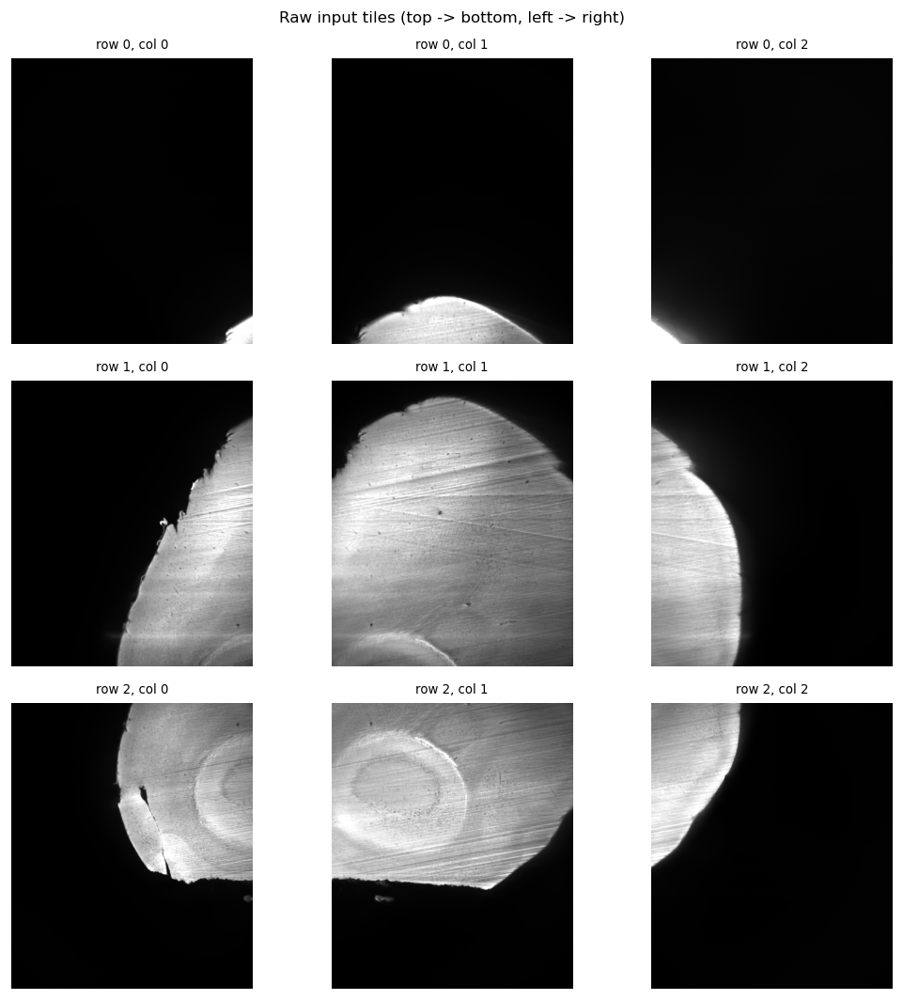

In [227]:
# -- Load and display the raw tiles + tissue threshold -------------
grid_tiles = [[load_tile(p) for p in row] for row in GRID]

# Tissue mask threshold from an Otsu split over a subsample of every tile.
_sample = np.concatenate([t[::8, ::8].ravel() for row in grid_tiles for t in row])
THRESH  = OTSU_MULTIPLIER * threshold_otsu(_sample)
print(f'Tissue threshold (Otsu x {OTSU_MULTIPLIER}) = {THRESH:.1f}')
for r, row in enumerate(grid_tiles):
    for c, t in enumerate(row):
        print(f'  row {r} col {c}: shape={t.shape} dtype={t.dtype} max={t.max():.1f}')

# Preview the raw input grid.
ncol = max(len(row) for row in grid_tiles)
fig, axes = plt.subplots(n_rows, ncol, figsize=(3 * ncol, 3 * n_rows), squeeze=False)
for r, row in enumerate(grid_tiles):
    for c in range(ncol):
        ax = axes[r][c]; ax.axis('off')
        if c < len(row):
            ax.imshow(norm_disp(row[c]), cmap='gray')
            ax.set_title(f'row {r}, col {c}', fontsize=8)
plt.suptitle('Raw input tiles (top -> bottom, left -> right)', fontsize=10)
plt.tight_layout(); plt.show()

---
## Stage 1 — Horizontal registration (each grid row → one row image)

Every adjacent pair in a row is registered left→right with the **`basic_horizontal`
engine**: the overlap strips are cropped to the tissue edge (yellow box), high-passed, and
**Hann-windowed** before the **constrained-search** PCC (peak taken within `|dy| ≤ MAX_CROSS_PX`
and `dx` near the assumed overlap). For each pair you see the box on both tiles, the Hann window
that was applied, and the naive-vs-registered R/G/Y overlay. Each row is then composited
**twice** — registered and naive — so the comparison carries through to the mosaic.


  ROW 0  (3 tiles)
  row 0: pair 0-1  overlap=432px  box rows 2222-2560 (338px tall)  [hugs bottom]  dy=-1.94 dx=-52.80  peak_ratio=1.243 peak_z=6.2


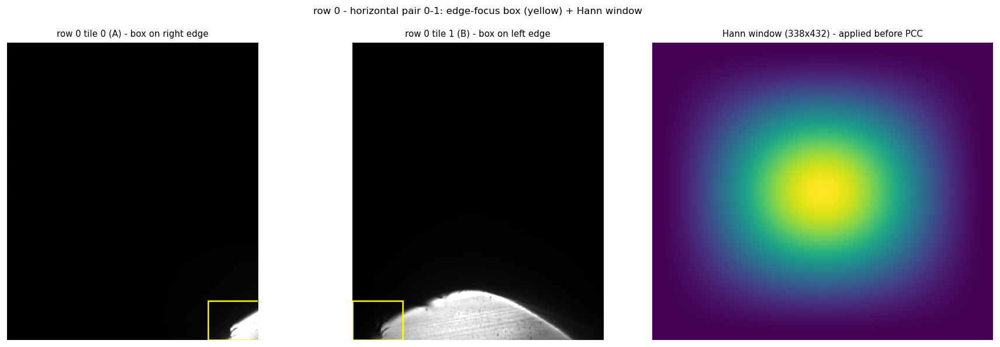

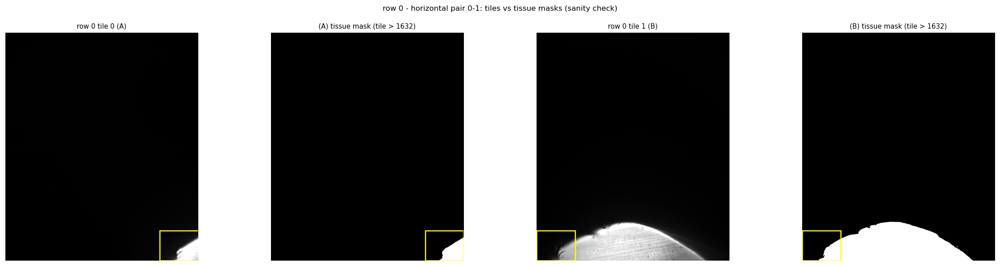

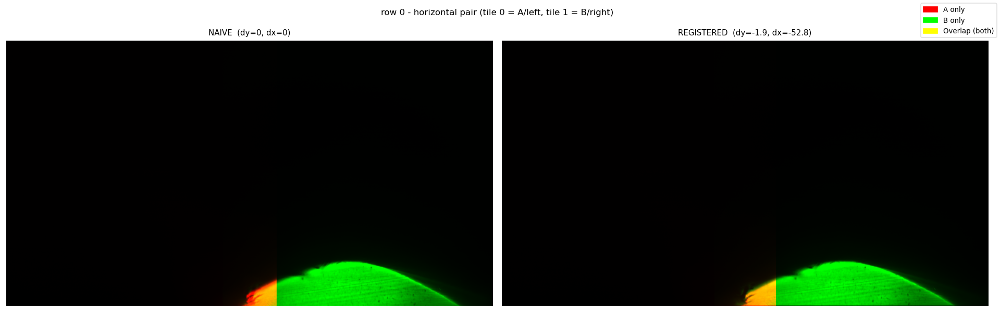

  row 0: pair 1-2  overlap=432px  box rows 2283-2560  peak_ratio=1.023 < 1.1 (peak_z=4.4)  -> peak NOT dominant (smooth/noise, no registrable texture), using nominal overlap (dy=dx=0)
  row 0: registered shape=(2562, 5563)   naive shape=(2560, 5616)

  ROW 1  (3 tiles)
  row 1: pair 0-1  overlap=432px  box rows 244-2560 (2316px tall)  [hugs bottom]  dy=+1.12 dx=-40.23  peak_ratio=1.857 peak_z=13.6


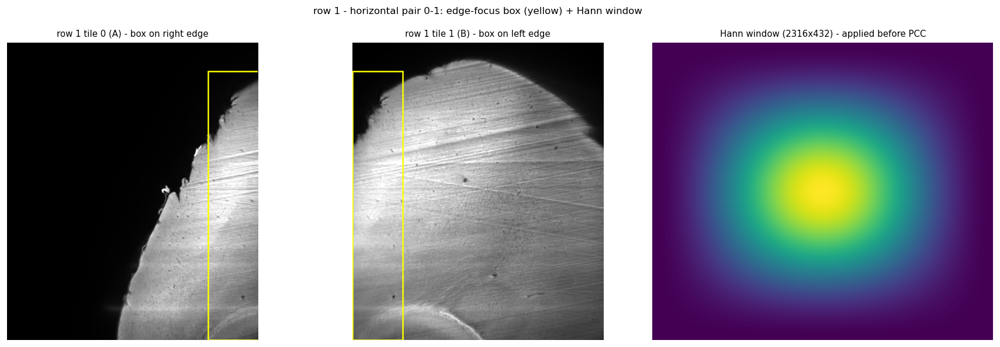

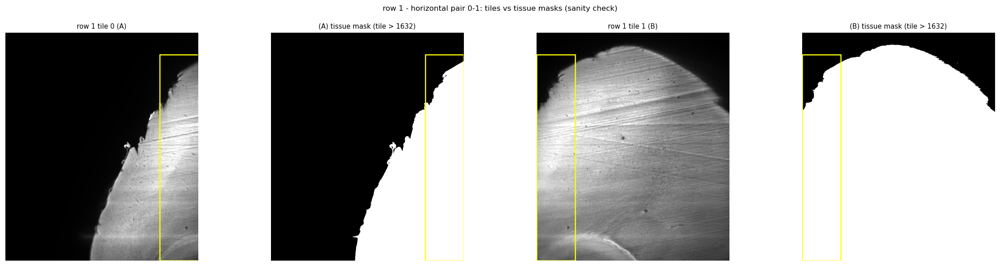

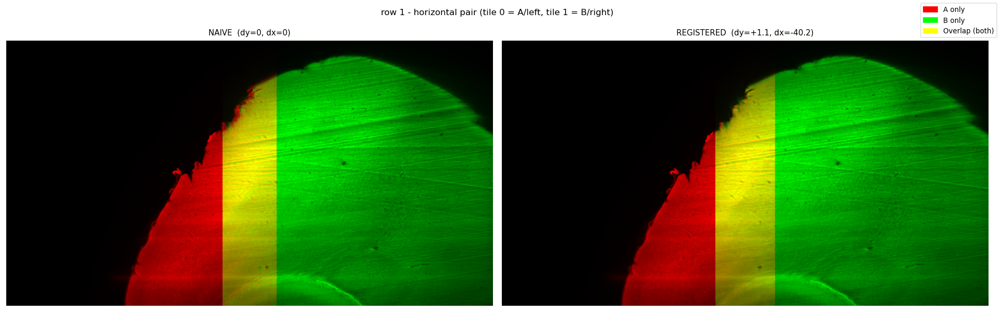

  row 1: pair 1-2  overlap=432px  box rows 318-2560 (2242px tall)  [hugs bottom]  dy=-5.85 dx=-33.48  peak_ratio=1.629 peak_z=12.1


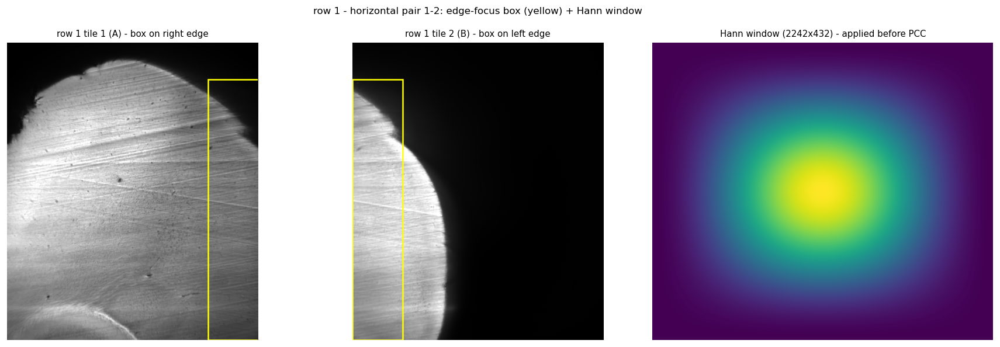

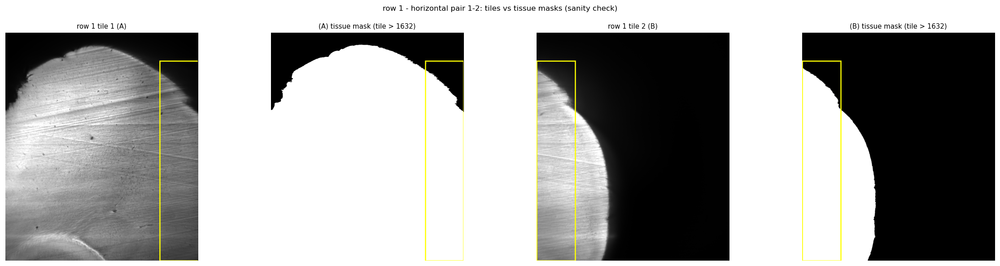

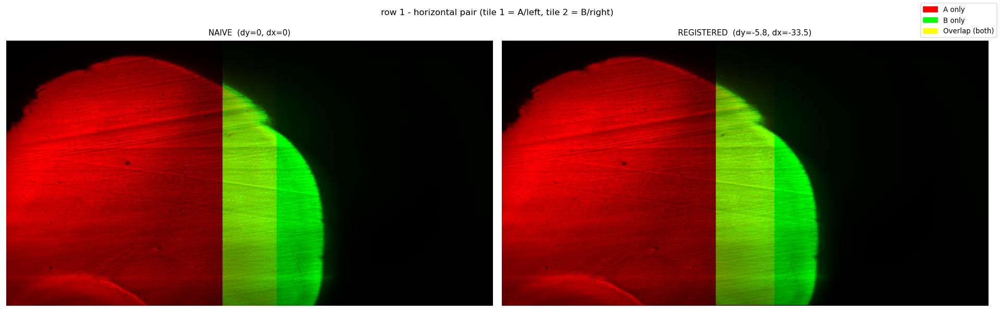

  row 1: registered shape=(2566, 5543)   naive shape=(2560, 5616)

  ROW 2  (3 tiles)
  row 2: pair 0-1  overlap=432px  box rows 0-1862 (1862px tall)  [hugs top]  dy=+1.89 dx=-47.11  peak_ratio=1.231 peak_z=11.3


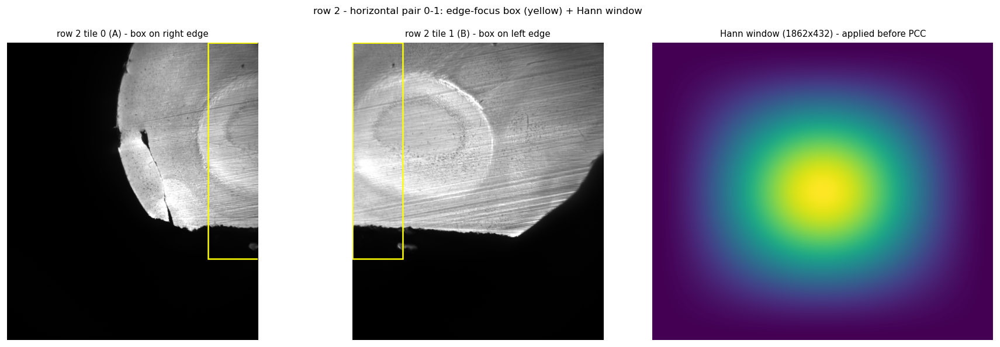

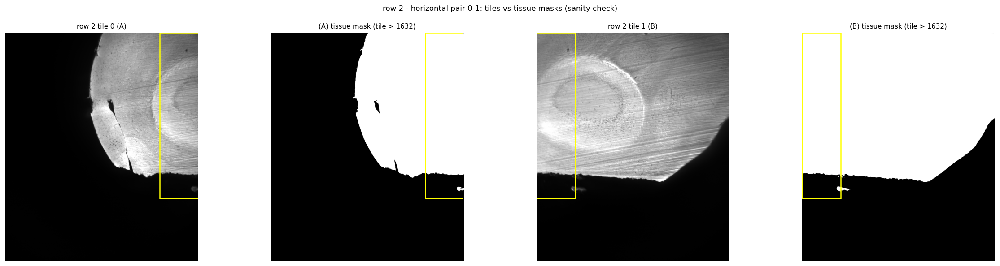

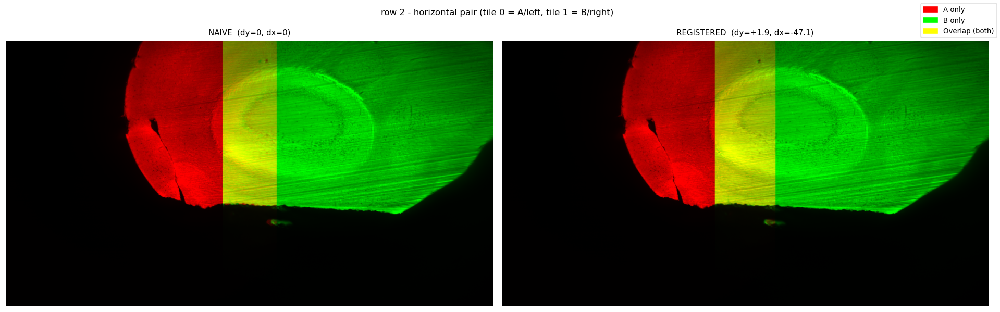

  row 2: pair 1-2  overlap=432px  box rows 0-1555 (1555px tall)  [hugs top]  dy=-3.18 dx=-32.89  peak_ratio=1.307 peak_z=8.8


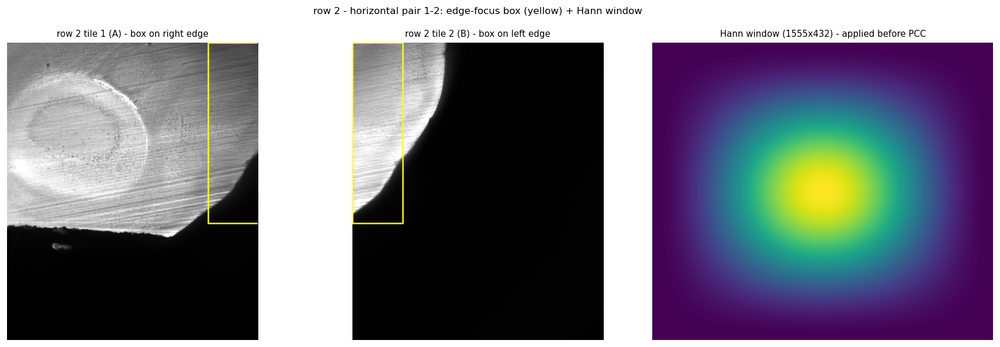

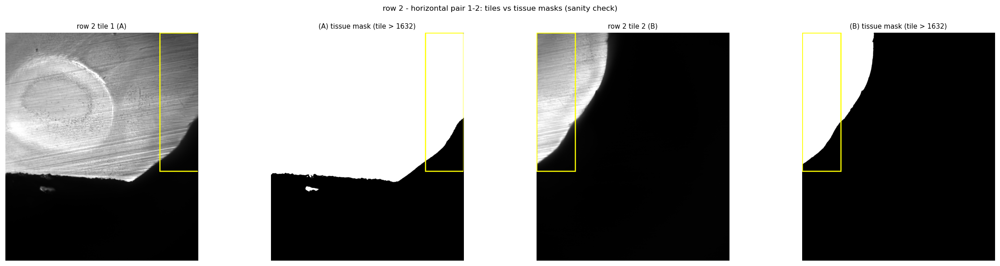

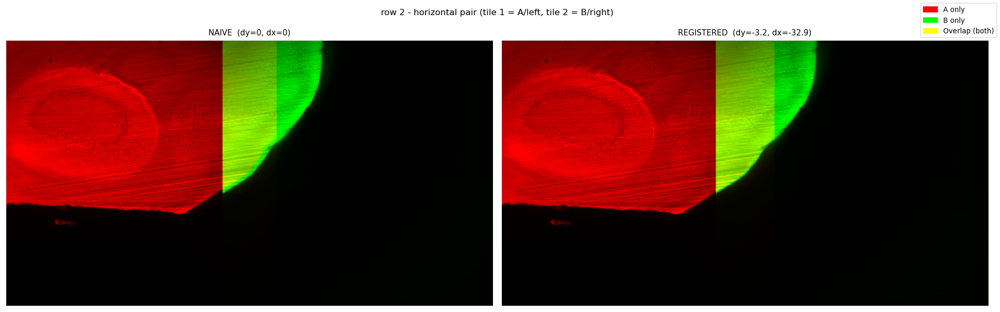

  row 2: registered shape=(2563, 5536)   naive shape=(2560, 5616)


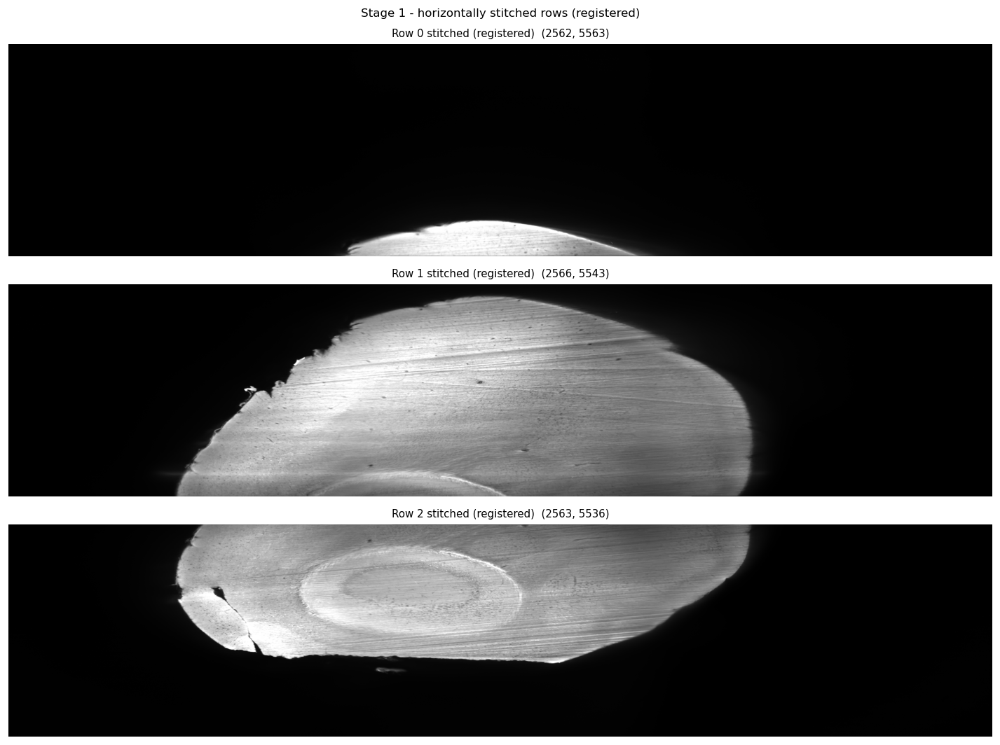

In [228]:
# -- Stage 1: build each row image (registered + naive) ------------
row_shifts = []   # per row: [(dy, dx, overlap), ...]
rows_reg   = []   # registered row images
rows_naive = []   # naive row images (fixed overlap, dy=dx=0)

for r, tiles in enumerate(grid_tiles):
    print(f"\n{'='*70}\n  ROW {r}  ({len(tiles)} tiles)\n{'='*70}")
    if len(tiles) == 1:
        shifts = []
        print('  single tile - nothing to register')
    else:
        shifts = register_row(tiles, OVERLAP_FRAC_H, THRESH, EDGE_PAD_PX,
                              UPSAMPLE, HIGHPASS_SIGMA, MAX_CROSS_PX_H, JOIN_BAND_FRAC,
                              MIN_SIGNAL_FRAC, MIN_PEAK_RATIO, MIN_PEAK_Z,
                              label=f'row {r}', show=True)
    reg   = composite_line(tiles, shifts, 'h', OVERLAP_FRAC_H, register=True)
    naive = composite_line(tiles, shifts, 'h', OVERLAP_FRAC_H, register=False)
    row_shifts.append(shifts)
    rows_reg.append(reg)
    rows_naive.append(naive)
    print(f'  row {r}: registered shape={reg.shape}   naive shape={naive.shape}')

# Show the registered row images stacked for a quick look.
fig, axes = plt.subplots(n_rows, 1, figsize=(12, 3 * n_rows), squeeze=False)
for r, img in enumerate(rows_reg):
    axes[r][0].imshow(norm_disp(img), cmap='gray', aspect='auto')
    axes[r][0].set_title(f'Row {r} stitched (registered)  {img.shape}', fontsize=9)
    axes[r][0].axis('off')
plt.suptitle('Stage 1 - horizontally stitched rows (registered)', fontsize=10)
plt.tight_layout(); plt.show()

---
## Stage 2 — Vertical registration (row images → full mosaic)

The registered row images are registered top→bottom with the **same edge-focus + Hann-window
PCC** as Stage 1, just rotated: the overlap strips are cropped to the tissue **columns** (the
vertical seam runs left↔right), then high-passed and Hann-windowed before the **constrained-search**
PCC (`|dx| ≤ MAX_CROSS_PX`, `dy` near the assumed overlap). Each pair shows the box, the Hann
window, and the naive-vs-registered overlay. The naive mosaic is built in parallel from the
**naive** rows placed at the assumed overlap with no shift.

Registering rows top -> bottom (edge-focus box on columns + constrained PCC):
  rows: rows 0-1  overlap=512px  box cols 1806-3711 (1905px wide)  dy=-58.90 dx=-12.24


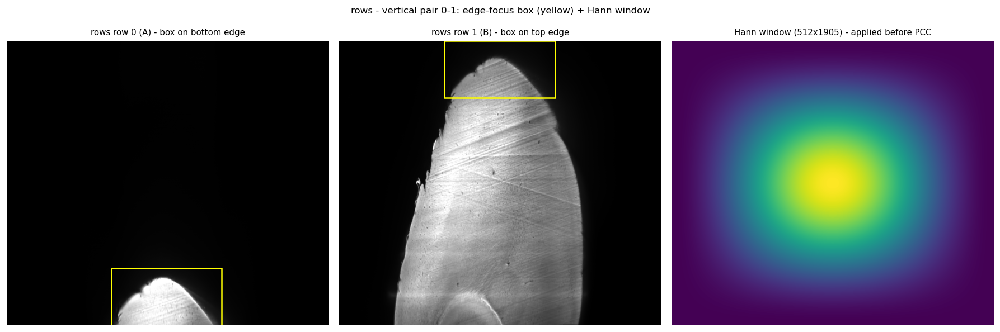

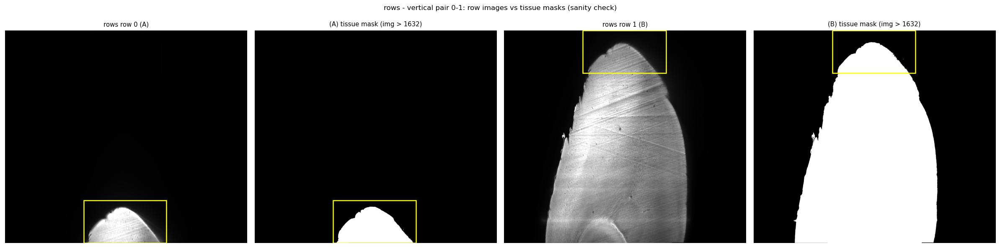

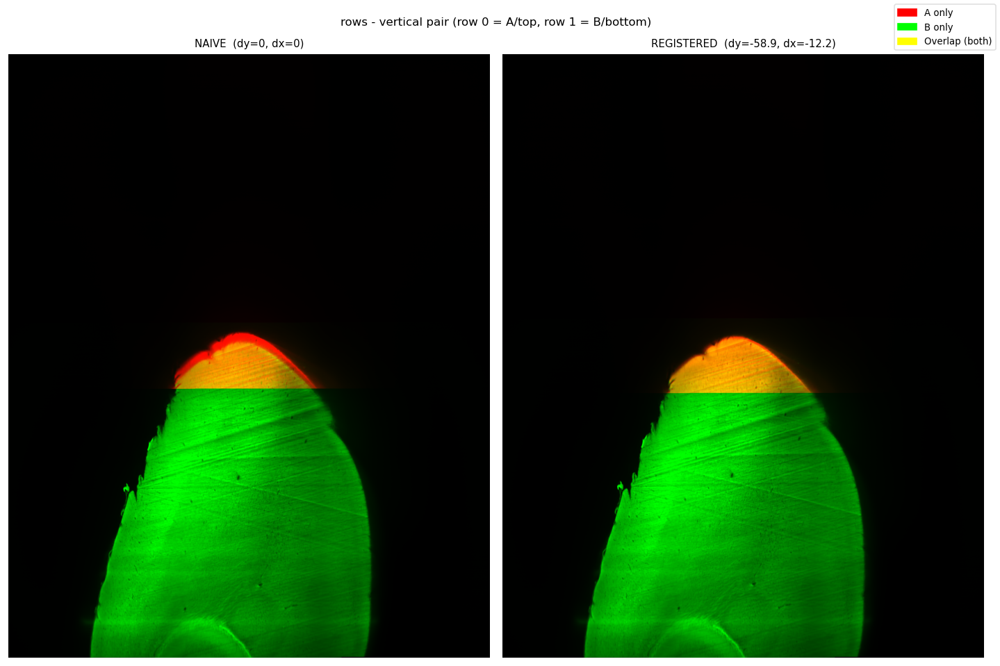

  rows: rows 1-2  overlap=513px  box cols 850-4280 (3430px wide)  dy=-46.25 dx=+7.05


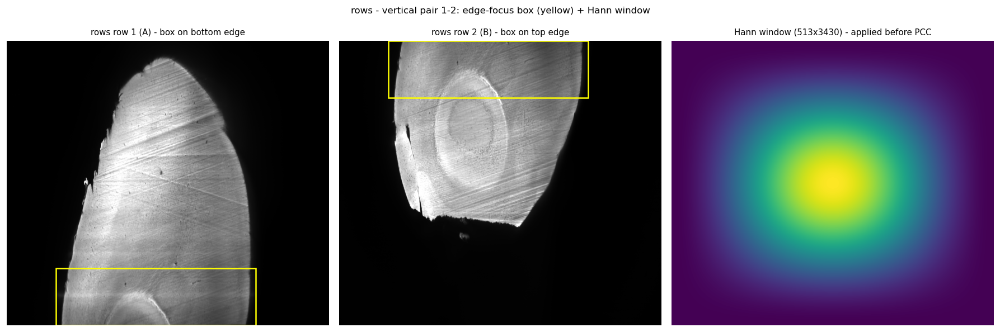

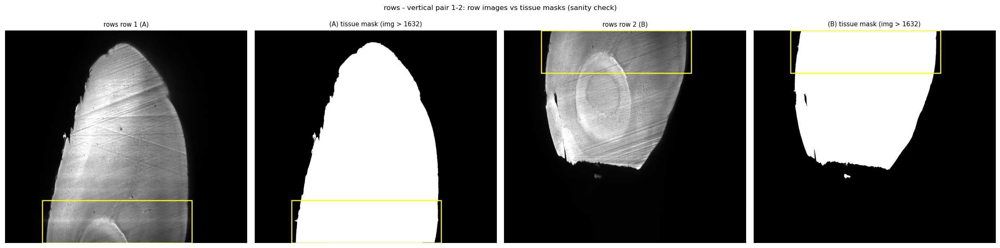

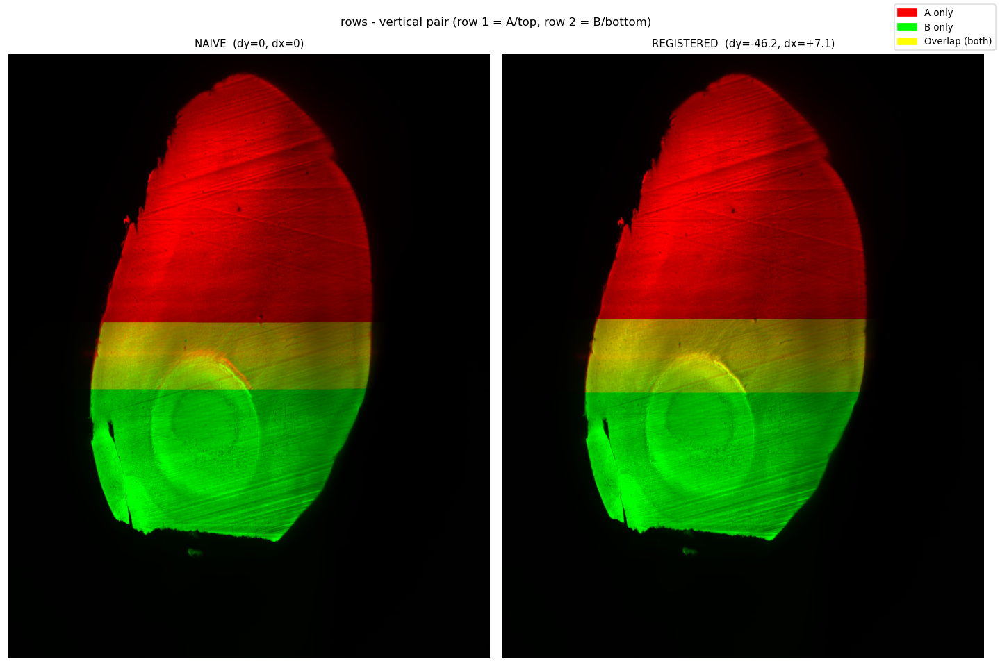


Registered mosaic shape = (6561, 5575)
Naive mosaic shape      = (6656, 5616)


In [229]:
# -- Stage 2: stitch the row images vertically ---------------------
if n_rows == 1:
    print('Only one row - the row image IS the full mosaic.')
    v_shifts     = []
    mosaic_reg   = rows_reg[0]
    mosaic_naive = rows_naive[0]
else:
    print('Registering rows top -> bottom (edge-focus box on columns + constrained PCC):')
    v_shifts = register_column(rows_reg, OVERLAP_FRAC_V, THRESH, EDGE_PAD_PX,
                               UPSAMPLE, HIGHPASS_SIGMA, MAX_CROSS_PX_V, JOIN_BAND_FRAC,
                               MIN_SIGNAL_FRAC, label='rows', show=True)
    mosaic_reg   = composite_line(rows_reg,   v_shifts, 'v', OVERLAP_FRAC_V, register=True)
    mosaic_naive = composite_line(rows_naive, v_shifts, 'v', OVERLAP_FRAC_V, register=False)

print(f'\nRegistered mosaic shape = {mosaic_reg.shape}')
print(f'Naive mosaic shape      = {mosaic_naive.shape}')

---
## Final output — naive vs registered full mosaic

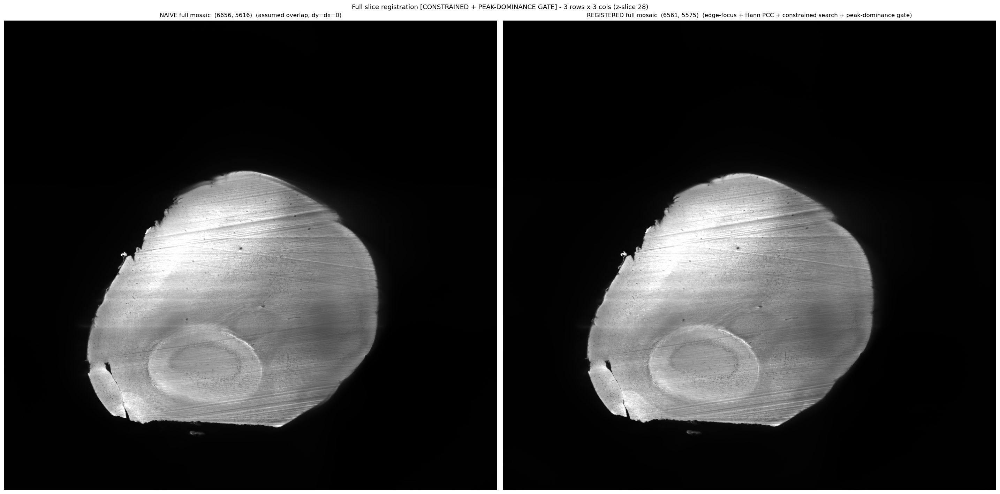

Registered mosaic saved to: /Users/spaltahill/July 24 Test Images/260713_UltraII_5300149-1R_AFp80_HNA568p65_cfos647p80_thickness3d5_width80_step40_ol20_z0028_slice_registered_new_method.tif


In [230]:
# -- Final: naive vs registered full mosaic ------------------------
fig, axes = plt.subplots(1, 2, figsize=(
    min(24, max(mosaic_reg.shape[1], mosaic_naive.shape[1]) // 80 + 2), 12))
axes[0].imshow(norm_disp(mosaic_naive), cmap='gray', aspect='auto')
axes[0].set_title(f'NAIVE full mosaic  {mosaic_naive.shape}  (assumed overlap, dy=dx=0)', fontsize=10)
axes[0].axis('off')
axes[1].imshow(norm_disp(mosaic_reg), cmap='gray', aspect='auto')
axes[1].set_title(f'REGISTERED full mosaic  {mosaic_reg.shape}  '
                  f'(edge-focus + Hann PCC + constrained search + peak-dominance gate)', fontsize=10)
axes[1].axis('off')
plt.suptitle(f'Full slice registration [CONSTRAINED + PEAK-DOMINANCE GATE] - {n_rows} rows x '
             f'{max(len(r) for r in GRID)} cols (z-slice {Z_SLICE})', fontsize=11)
plt.tight_layout(); plt.show()

# Save the registered mosaic (normalised for visualisation).
out_path = Path(BASE) / f"{_stem}_z{Z_SLICE:04d}_slice_registered_new_method.tif"
tifffile.imwrite(str(out_path), norm_disp(mosaic_reg).astype('float32'))
print(f'Registered mosaic saved to: {out_path}')